In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'

In [2]:
import scanpy as sc
import pandas as pd
import scanpy as sc 
import sys 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import warnings
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
import matplotlib as mpl

warnings.filterwarnings('ignore')
sys.path.append('../../src')

from spaceoracle.plotting.cartography import Cartography
import celloracle as co
from celloracle.applications import Gradient_calculator
from celloracle.applications.scatter_to_grid import scatter_value_to_grid_value
from celloracle.applications.differentiation_flow import get_gradient, normalize_gradient
from spaceoracle.virtual_tissue import VirtualTissue

/ihome/djishnu/alw399/.local/lib/python3.9/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound
2025-07-08 14:33:31.343913: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /ihome/crc/install/gcc-12.2.0/postgresql/15.2/lib:/ihome/crc/install/gcc-12.2.0/imagemagick/6.9.12/lib:/ihome/crc/install/gcc-12.2.0/geos/3.9.4/lib:/ihome/crc/install/gcc-12.2.0/zstd/zstd-1.5.5/lib:/ihome/crc/install/gcc-12.2.0/unixodbc/2.3.11/lib:/ihome/crc/install/sodium/1.0.18/lib:/ihome/crc/install/gcc-12.2.0/r/4.4.0/lib64/R/lib:/ihome/crc/install/gcc-12.2

In [3]:
# adata = sc.read_h5ad('/Users/koush/Desktop/training_data/snrna_human_tonsil.h5ad')
adata = sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/snrna_human_tonsil.h5ad')
adata.obsm['X_umap'] = pd.read_csv('../../notebooks/human_tonsil/umap.csv', index_col=0).values
adata.obs = adata.obs.join(pd.read_csv('../../notebooks/human_tonsil/tonsil_cell_types.csv', index_col=0))

sc.pp.pca(adata)
sc.pp.neighbors(adata)

# adata.layers['imputed_count'] = np.load('../../notebooks/human_tonsil/imputed_counts.npy')

In [ ]:
import json

with open('./colors.json', 'r') as f:
    color_dict = json.load(f)

In [ ]:
adata.obs['cell_type_major'] = adata.obs.cell_type_2.replace(
    {
        'GC Dark Zone': 'Germinal Center B cells', 
        'GC Light Zone': 'Germinal Center B cells', 
        'GC Intermediate Zone': 'Germinal Center B cells', 
        'plasma': 'Plasma cells', 
        'B_naive': 'B cells', 
        'B_memory': 'B cells', 
        'B_germinal_center': 'Germinal Center B cells', 
        'Naive CD4 T': 'T cells', 
        'Treg': 'T cells', 
        'T memory': 'T cells', 
        'Th1': 'T cells', 
        'Th2': 'T cells', 
        'T_CD8': 'T cells', 
        'T_follicular_helper': 'T cells', 
        'mDC': 'Dendritic cells', 
        'FDC': 'Dendritic cells', 
        'myeloid': 'Myeloid cells', 
        'NK': 'NK cells', 
        'pDC': 'Dendritic cells', 
        'T_double_neg': 'T cells'
    }
)

... storing 'cell_type_2' as categorical
... storing 'cell_type_major' as categorical


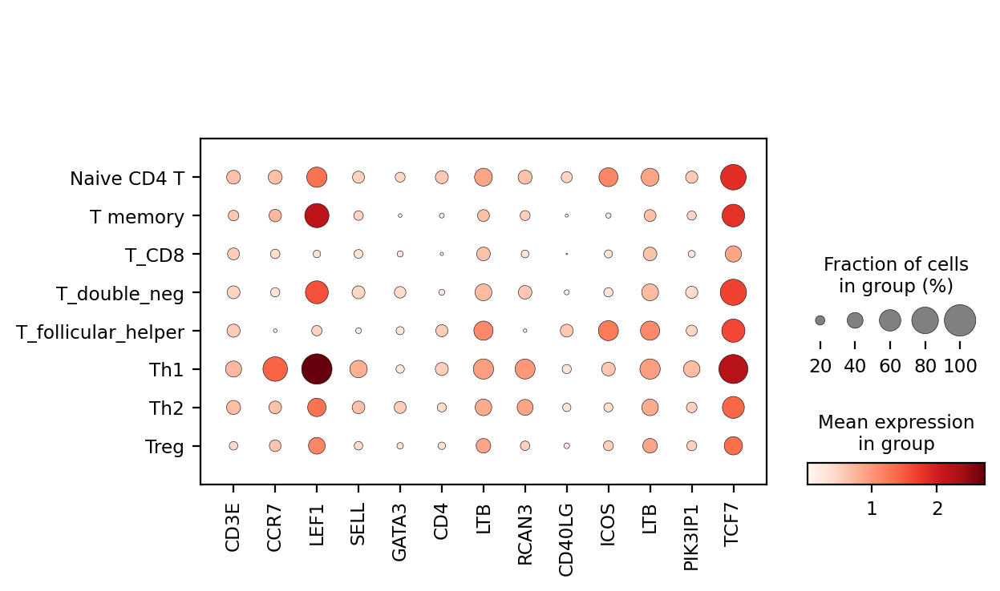

In [ ]:
sc.pl.dotplot(
    adata[adata.obs['cell_type_major'] == 'T cells'], 
    var_names=['CD3E', 'CCR7', 'LEF1', 'SELL', 'GATA3','CD4', 'LTB', 'RCAN3','CD40LG', 'ICOS', 'LTB', 'PIK3IP1', 'TCF7'], 
    groupby='cell_type_2', 
)

In [ ]:
%matplotlib inline

In [ ]:
figure_params = {
    'dpi': 300, 
    'bbox_inches': 'tight', 
    'format': 'svg', 
    'transparent': True
}

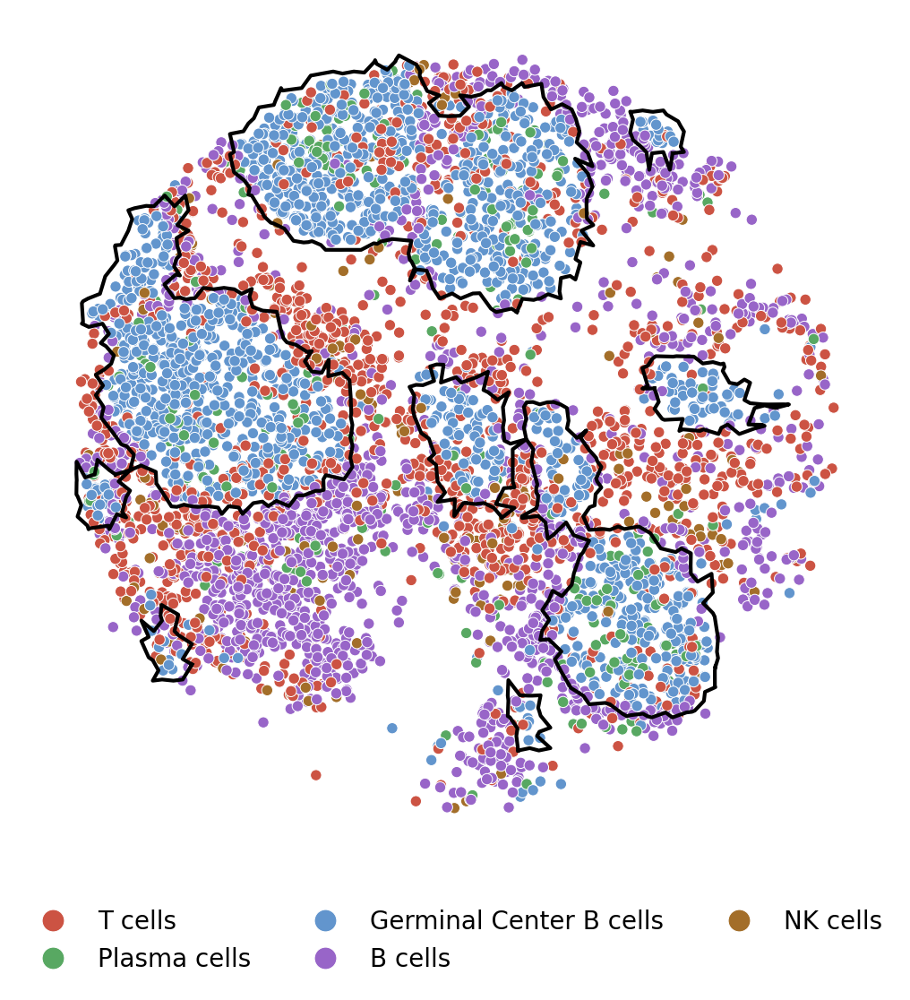

In [35]:
plt.rcParams['figure.figsize'] = (6, 6)

import alphashape

ct_points_wt = {}
for ct in adata.obs['cell_type_major'].unique():
    points = np.asarray(
        adata[adata.obs['cell_type_major'] == ct].obsm['spatial'])
    delta = 30
    points = np.vstack(
        (points +[-delta,delta], points +[-delta,-delta], 
        points +[delta,delta], points +[delta,-delta]))
    ct_points_wt[ct] = points

adatax = adata[~adata.obs.cell_type_major.isin([
    'Myeloid cells', 'Dendritic cells'])]
sns.scatterplot(data=adatax.obs, 
    x=adatax.obsm['spatial'][:,0], 
    y=adatax.obsm['spatial'][:,1],
    s=20,
    hue='cell_type_major',
    legend='brief', palette=color_dict)
plt.axis('off')

alpha_shape = alphashape.alphashape(ct_points_wt['Germinal Center B cells'], alpha=0.035)
for geom in alpha_shape.geoms:
    if geom.area > 10000:
        plt.plot(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color='black', alpha=1)
plt.legend(bbox_to_anchor=(0.5, -0.05), 
    loc='upper center', ncol=3, frameon=False, 
    markerscale=2, fontsize=10)
plt.savefig('./figures/tonsil_celltypes.svg', **figure_params)
plt.show()

... storing 'cell_type_2' as categorical
... storing 'cell_type_major' as categorical


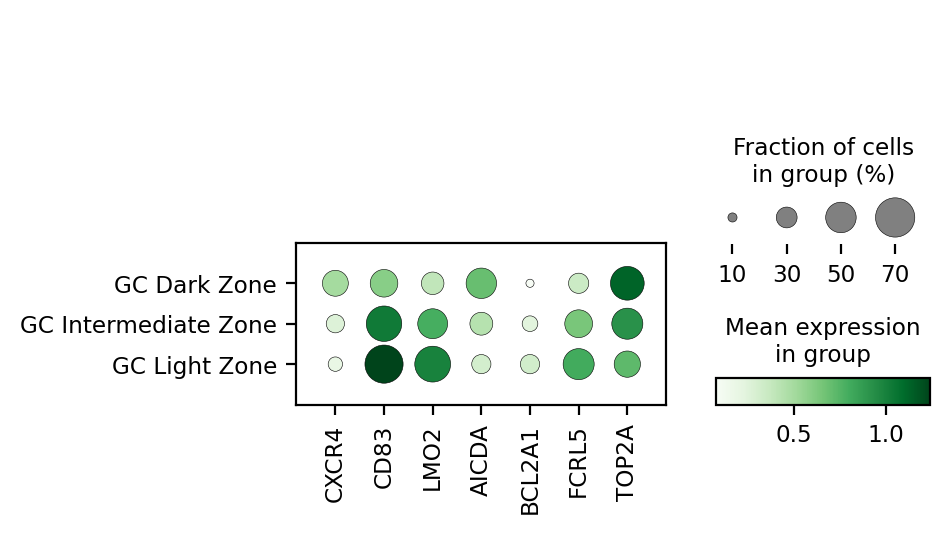

In [36]:
sc.pl.dotplot(adata[adata.obs.cell_type_2.str.contains('GC')], 
    var_names=['CXCR4', 'CD83', 'LMO2', 'AICDA', 'BCL2A1', 'FCRL5', 'TOP2A'], 
    groupby='cell_type_2', layer='normalized_count', cmap='Greens', show=False)

plt.savefig('./figures/dotplot_GC.svg', **figure_params)

In [40]:
tonsil = VirtualTissue(
    adata = adata,
    annot = 'cell_type_2',
    betadatas_path = '/Volumes/SSD/lasso_runs/human_tonsil',
    ko_path = '/Volumes/SSD/genome_screens/human_tonsil',
    color_dict=color_dict
)

rename={
    'T_follicular_helper': 'T Follicular\nHelper',
    'T_CD8': 'T CD8+',
    'T_CD4': 'T CD4+',
    'B_germinal_center': 'B Germinal\nCenter',
    'B_naive': 'B\nNaive',
    'B_memory': 'B\nMemory',
}

In [41]:
from spaceoracle.models.parallel_estimators import create_spatial_features
from scipy.stats import pearsonr
from spaceoracle.plotting.cartography import xy_from_adata

RADIUS = 200

xy = xy_from_adata(adata)

spf = create_spatial_features(
    x=adata.obsm['spatial'][:, 0], 
    y=adata.obsm['spatial'][:, 1], 
    celltypes=adata.obs.cell_type_2, 
    obs_index=adata.obs_names,
    radius = RADIUS
)

In [39]:
cell_groups = {
    'GC B Cells': ['GC Light Zone', 'GC Dark Zone', 'GC Intermediate Zone'],
    'B cells': ['GC Light Zone', 'GC Dark Zone', 'GC Intermediate Zone', 'B_naive', 'B_memory'],
    'T cells': ['Naive CD4 T', 'T_follicular_helper', 'Th2', 'Th1', 'Treg'],
    'T cells': ['Naive CD4 T', 'T_follicular_helper', 'Th2', 'Th1', 'Treg'],
    'All T cells': ['Naive CD4 T', 'T_follicular_helper', 'Th2', 'Th1', 'Treg', 'T_CD8'],
    
}

In [246]:
def plot_gene_vs_proximity(perturb_target, perturbed_df, gene, color_gene, cell_filter, 
                          proximity_threshold=150, gene_threshold=0.005, ax=None, mode='ko'):
    # perturbed_df = pd.read_parquet(
    #     f'/Volumes/SSD/genome_screens/human_tonsil/{perturb_target}_4n_maxx.parquet')
    
    datadf = spf[
        [i+'_within' for i in cell_groups['GC B Cells']
            ]].sum(1).to_frame().join(adata.obs.cell_type_2).query(
             f'cell_type_2.isin(["{cell_filter}"])').join(xy).join(
        ((perturbed_df-adata.to_df(layer='imputed_count'))/adata.to_df(layer='imputed_count'))*100
    )
    datadf = datadf[datadf[0] < proximity_threshold]
    
    if ax is None:
        ax = plt.gca()
    
    try:
        corr = pearsonr(datadf[datadf[gene]>gene_threshold][0], datadf[datadf[gene]>gene_threshold][gene]).statistic
        ax.set_title(f"{perturb_target} {mode.upper()} in\n{cell_filter}\nCorrelation: {corr:.4f}")
    except:
        corr = 0
        ax.set_title(f"{perturb_target} {mode.upper()} in\n{cell_filter}")
        
    scatter = ax.scatter(
        datadf[0], 
        datadf[gene], 
        c=datadf[color_gene],
        cmap='rainbow',
    )
    plt.colorbar(scatter, label=f'{color_gene} % change', shrink=0.75, ax=ax, format='%.2f')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_ylabel(f'{gene} % change')
    ax.set_xlabel(f'Number of GC B cells within {RADIUS}um')
    
    return ax, datadf

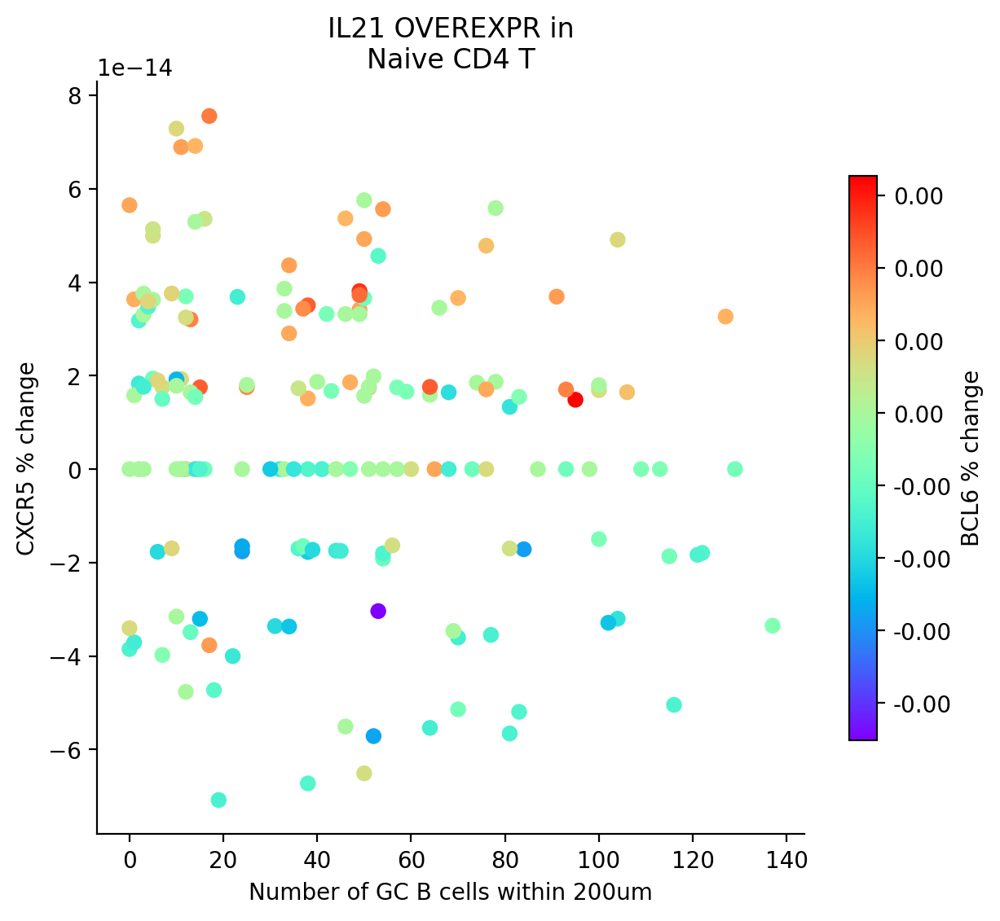

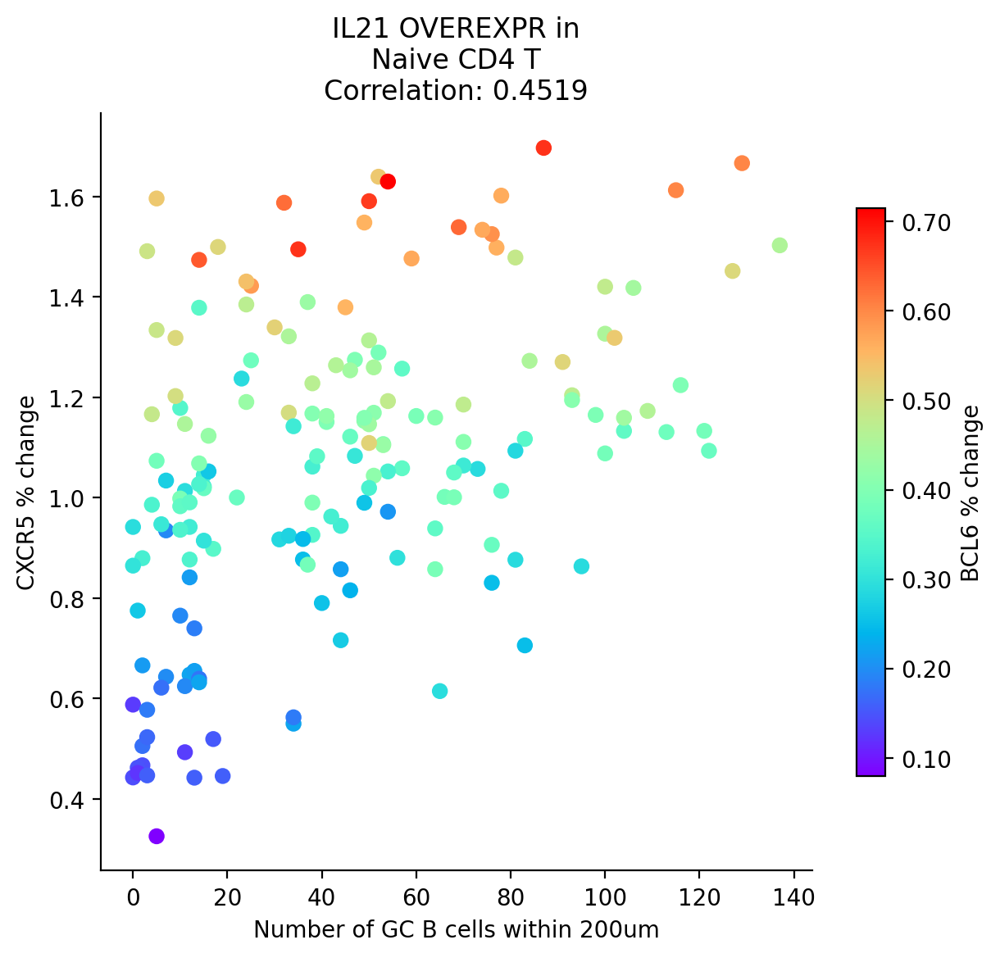

In [256]:
plt.rcParams['figure.figsize'] = (7, 6)
plt.rcParams['figure.dpi'] = 100

perturbed_df = pd.read_parquet(
    '/Volumes/SSD/genome_screens/human_tonsil_scGPT/IL21_4n_maxx.parquet')

plot_gene_vs_proximity(
    perturb_target='IL21',
    perturbed_df=perturbed_df, 
    mode='OverExpr',
    gene='CXCR5', 
    color_gene='BCL6', 
    cell_filter='Naive CD4 T', 
    
)
plt.savefig(
    './figures/scgpt_proximity_IL21_OVX_CXCR5.svg', 
    **figure_params
)
plt.show()


perturbed_df = pd.read_parquet(
    '/Volumes/SSD/genome_screens/human_tonsil/IL21_4n_maxx.parquet')

plot_gene_vs_proximity(
    perturb_target='IL21',
    perturbed_df=perturbed_df, 
    mode='OverExpr',
    gene='CXCR5', 
    color_gene='BCL6', 
    cell_filter='Naive CD4 T', 
    
)
plt.savefig(
    './figures/proximity_IL21_OVX_CXCR5.svg', 
    **figure_params
)
plt.show()

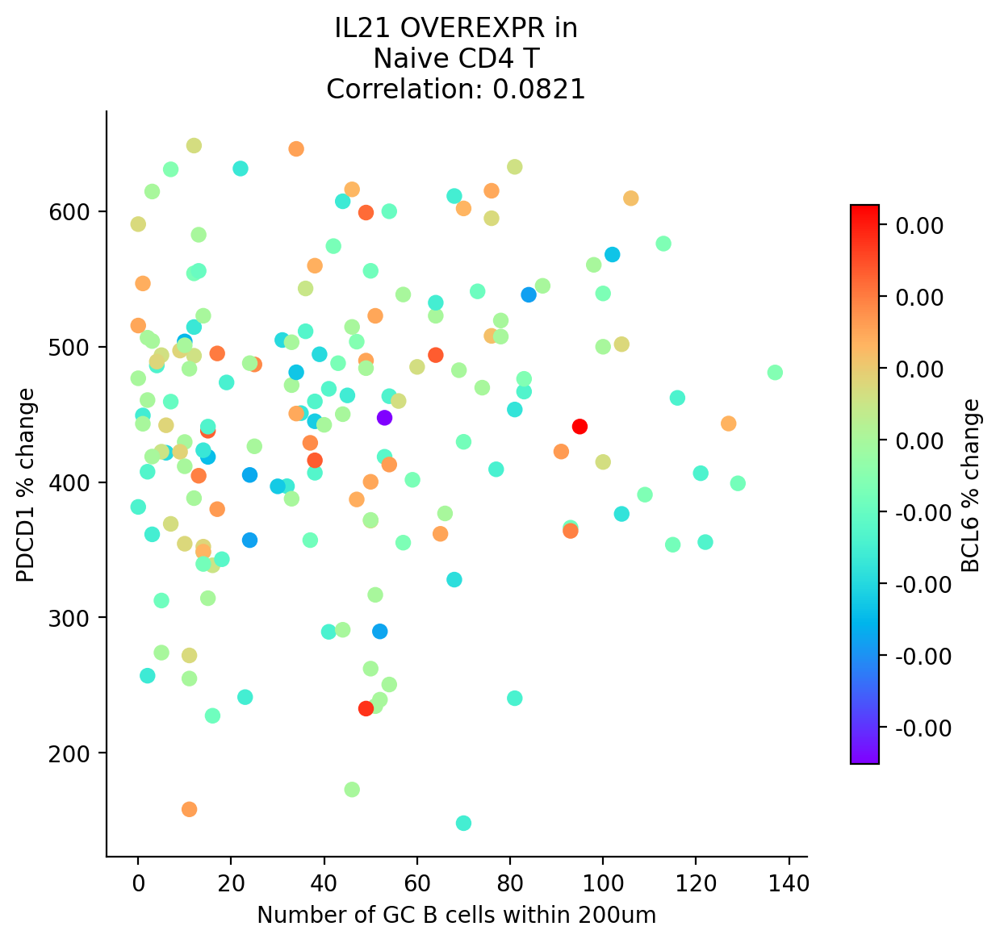

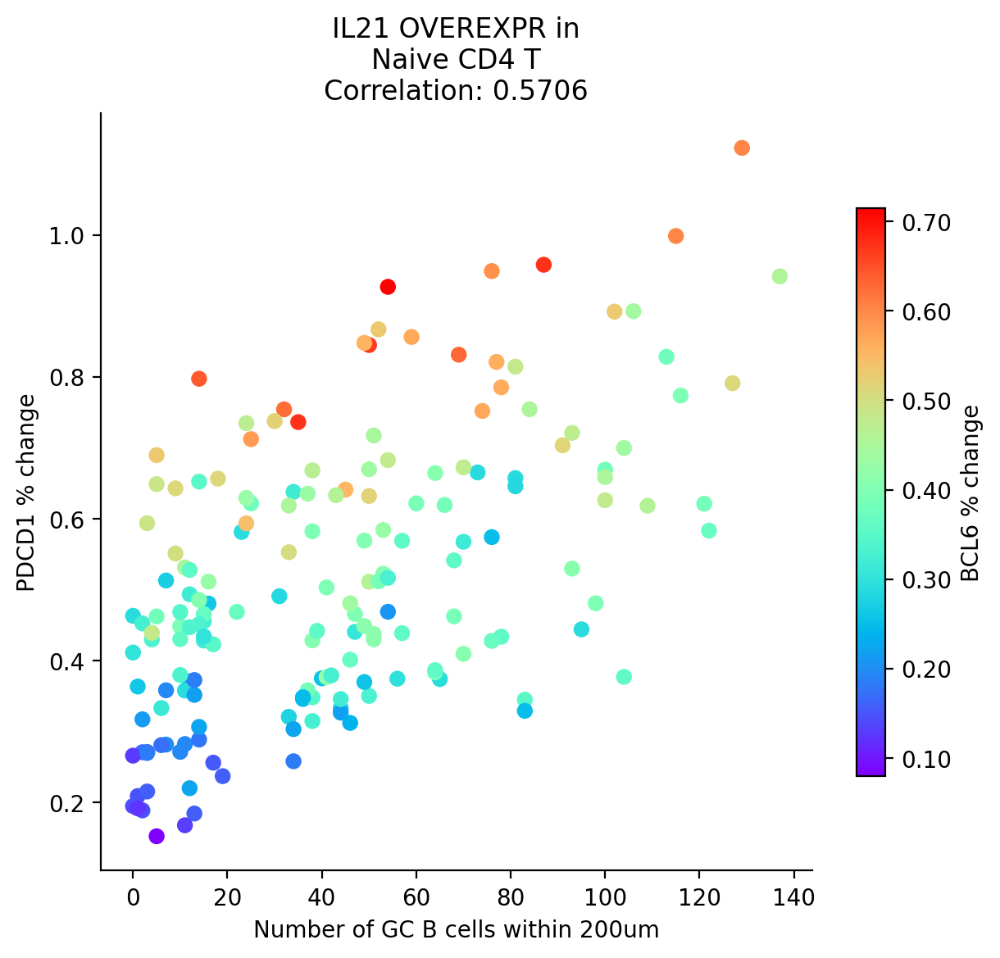

In [255]:
plt.rcParams['figure.figsize'] = (7, 6)
plt.rcParams['figure.dpi'] = 100

perturbed_df = pd.read_parquet(
    '/Volumes/SSD/genome_screens/human_tonsil_scGPT/IL21_4n_maxx.parquet')

plot_gene_vs_proximity(
    perturb_target='IL21',
    perturbed_df=perturbed_df, 
    mode='OverExpr',
    gene='PDCD1', 
    color_gene='BCL6', 
    cell_filter='Naive CD4 T', 
    
)
plt.savefig(
    './figures/scgpt_proximity_IL21_OVX_PDCD1.svg', 
    **figure_params
)
plt.show()


perturbed_df = pd.read_parquet(
    '/Volumes/SSD/genome_screens/human_tonsil/IL21_4n_maxx.parquet')

plot_gene_vs_proximity(
    perturb_target='IL21',
    perturbed_df=perturbed_df, 
    mode='OverExpr',
    gene='PDCD1', 
    color_gene='BCL6', 
    cell_filter='Naive CD4 T', 
    
)
plt.savefig(
    './figures/proximity_IL21_OVX_PDCD1.svg', 
    **figure_params
)
plt.show()

In [19]:
# tonsil.plot_radar(genes=[['PAX5', 'BCL6',  'GATA3', 'STAT4', 'FOXO1', 'FOXP3']], 
#     show_for=['Th1', 'GC Light Zone', 'B_naive', 'B_memory',
#        'GC Intermediate Zone', 'T_follicular_helper', 'Naive CD4 T', 'T memory', 'T_CD8',
#        'Treg', 'Th2', 
#     ], 
#     cache_path='/tmp/', 
#     figsize=(10, 4),
#     dpi=120,
#     rename=rename)

# plt.show()

In [144]:
genes = [
    'PAX5', 'BCL6',  'GATA3', 'STAT4', 'FOXO1', 'FOXP3', 
    'IL7', 'IL4',  'IL6ST', 'GZMA', 'IL10', 'LGALS9', 
    'PDCD1', 'CD27',  'CXCR4', 'CCR2', 'IL7R', 'CXCR4'
]

show_for = [
    'B_germinal_center', 'B_naive', 'T_CD4',  
    'B_memory', 'T_follicular_helper', 'T_CD8'
]

In [ ]:
# impact_df = tonsil.compute_ko_impact(
#     annot='cell_type', 
#     baseline_only=False
# )

# impact_df.to_csv('../../notebooks/human_tonsil/impact_df.csv')

In [99]:
impact_df = pd.read_csv('../../notebooks/human_tonsil/impact_df.csv', index_col=0)

In [182]:
genesets = [['PAX5', 'BCL6',  'GATA3', 'STAT4', 'FOXO1', 'FOXP3'], 
        ['IL7', 'IL4',  'IL6ST', 'GZMA', 'IL10', 'LGALS9'], 
        ['PDCD1', 'CD27',  'CXCR4', 'CCR2', 'IL7R', 'CXCR4']
    ]

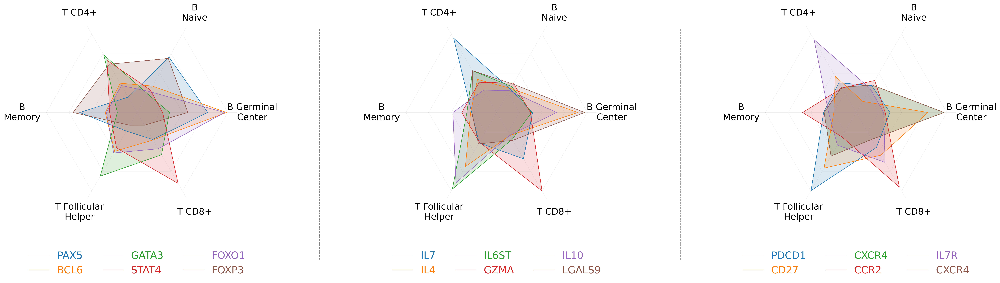

In [197]:
%matplotlib inline
tonsil.plot_radar(impact_df=impact_df,
    genes=genesets,
    show_for=show_for, 
    figsize=(30, 8),
    dpi=200,
    label_size=18,
    legend_size=20,
    rename=rename)

plt.savefig('./figures/spider_plots.svg', **figure_params)
plt.show()

In [133]:
import glob
annot = 'cell_type'
ko_data = []
for ko_file in glob.glob('../../notebooks/human_tonsil/CO_KO/*'):
    kotarget = ko_file.split('/')[-1].split('_')[1]
    data = pd.read_csv(ko_file, index_col=0)
    data = data.loc[tonsil.adata.obs_names] - tonsil.adata.to_df(layer='imputed_count')
    data = data.join(tonsil.adata.obs[annot]).groupby(annot).mean().abs().mean(axis=1)

    ds = {}
    for k, v in data.sort_values(ascending=False).to_dict().items():
        ds[k] = v

    data = pd.DataFrame.from_dict(ds, orient='index')
    data.columns = [kotarget]
    ko_data.append(data)
    
    out = pd.concat(ko_data, axis=1)

In [137]:
for i in ['IL7', 'IL4',  'IL6ST', 'GZMA', 'IL10', 'LGALS9', 'PDCD1', 'CD27',  'CXCR4', 'CCR2', 'IL7R', 'CXCR4']:
    out[i] = 0

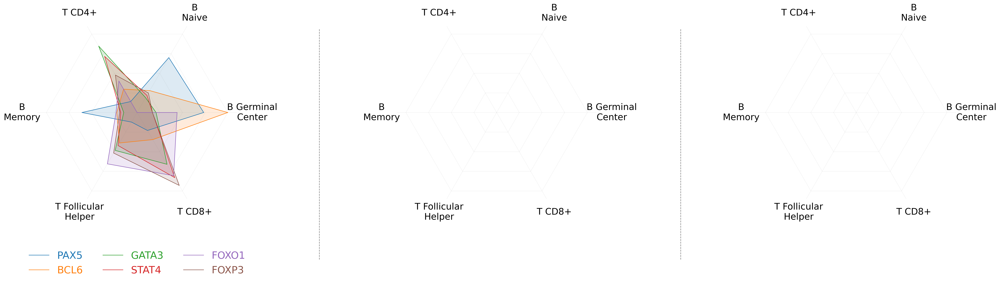

In [148]:
%matplotlib inline
tonsil.plot_radar(impact_df=out,
    genes=genesets,
    show_for=show_for, 
    figsize=(30, 8),
    dpi=200,
    label_size=18,
    legend_size=20,
    rename=rename)

plt.savefig('./figures/spider_plots_celloracle.svg', **figure_params)
plt.show()

In [194]:
import glob
annot = 'cell_type'
ko_data_scgpt = []
for ko_file in glob.glob('/Volumes/SSD/genome_screens/human_tonsil_scGPT/*.parquet'):
    kotarget = ko_file.split('/')[-1].split('_')[0]
    data = pd.read_parquet(ko_file)
    
    data = data.loc[tonsil.adata.obs_names] - tonsil.adata.to_df(layer='imputed_count')
    data = data.join(tonsil.adata.obs[annot]).groupby(annot).mean().abs().mean(axis=1)

    ds = {}
    for k, v in data.sort_values(ascending=False).to_dict().items():
        ds[k] = v

    data = pd.DataFrame.from_dict(ds, orient='index')
    data.columns = [kotarget]
    ko_data_scgpt.append(data)
    
    out_ko_data_scgpt = pd.concat(ko_data_scgpt, axis=1)

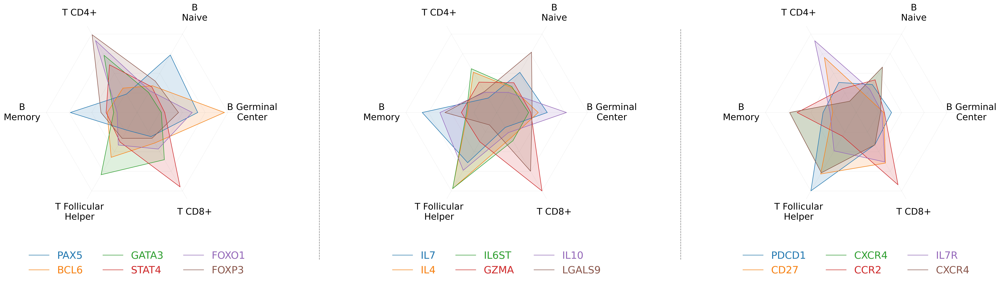

In [196]:
tonsil.plot_radar(impact_df=out_ko_data_scgpt,
    genes=genesets, 
    show_for=show_for, 
    figsize=(30, 8),
    dpi=200,
    label_size=18,
    legend_size=20,
    rename=rename)

plt.savefig('./figures/spider_plots_scgpt.svg', **figure_params)
plt.show()

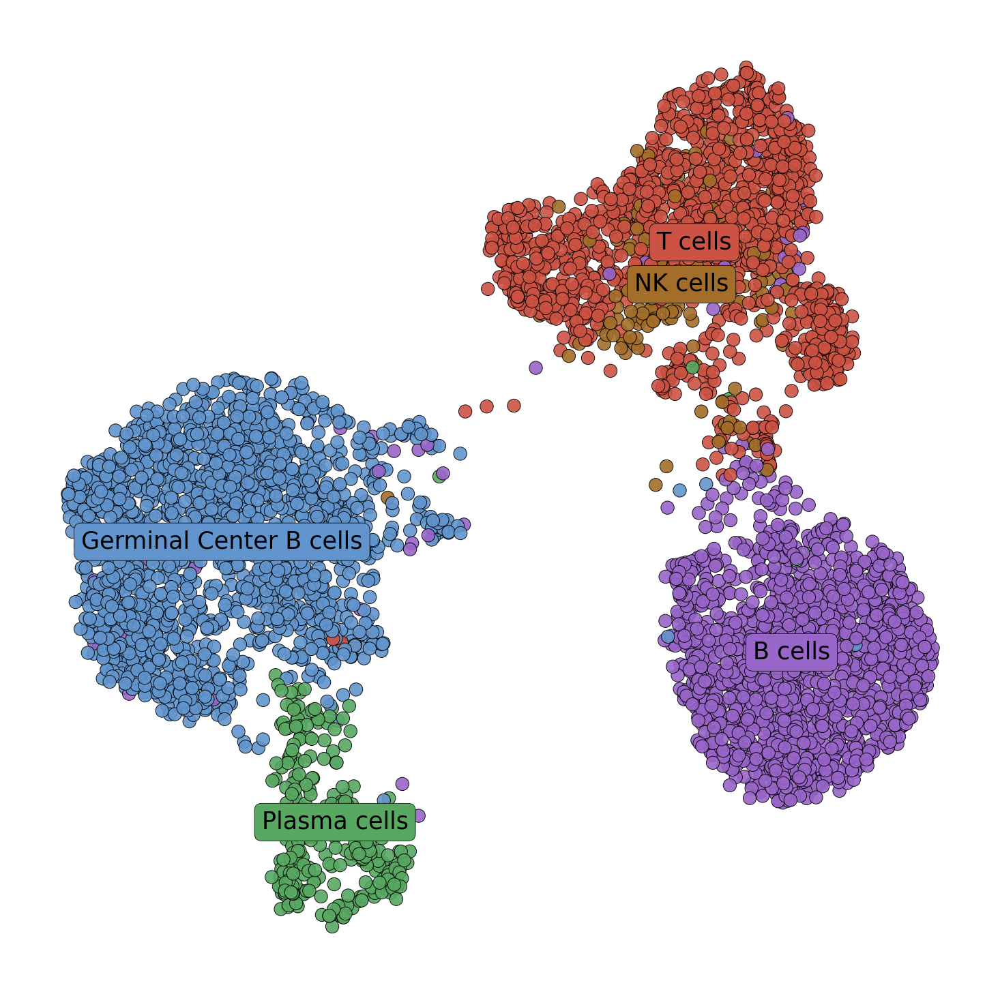

In [123]:
tonsil.init_cartography(adata[~adata.obs.cell_type_major.isin([
    'Myeloid cells', 'Dendritic cells'])])

tonsil.chart.plot_umap(
    hue='cell_type_major',
    color_dict=color_dict,
    scatter_size=15,
    linewidth=0.2,
    legend_fontsize=7,
)
plt.savefig('./figures/tonsil_umap.svg', **figure_params)

In [199]:
atmp = adata[~adata.obs.index.isin(adata.obs.iloc[[2250, 2593, 3255, 5281]].index)]
# atmp = adata[pd.read_csv('GC_selection.csv', index_col=0).index]
# atmp = adata
tonsil.init_cartography(atmp, 
    restrict_to=[
        'Naive CD4 T',
        'T_follicular_helper', 
        'Th2', 
        'Th1', 
        'Treg',
        'T_CD8',
    ]
)

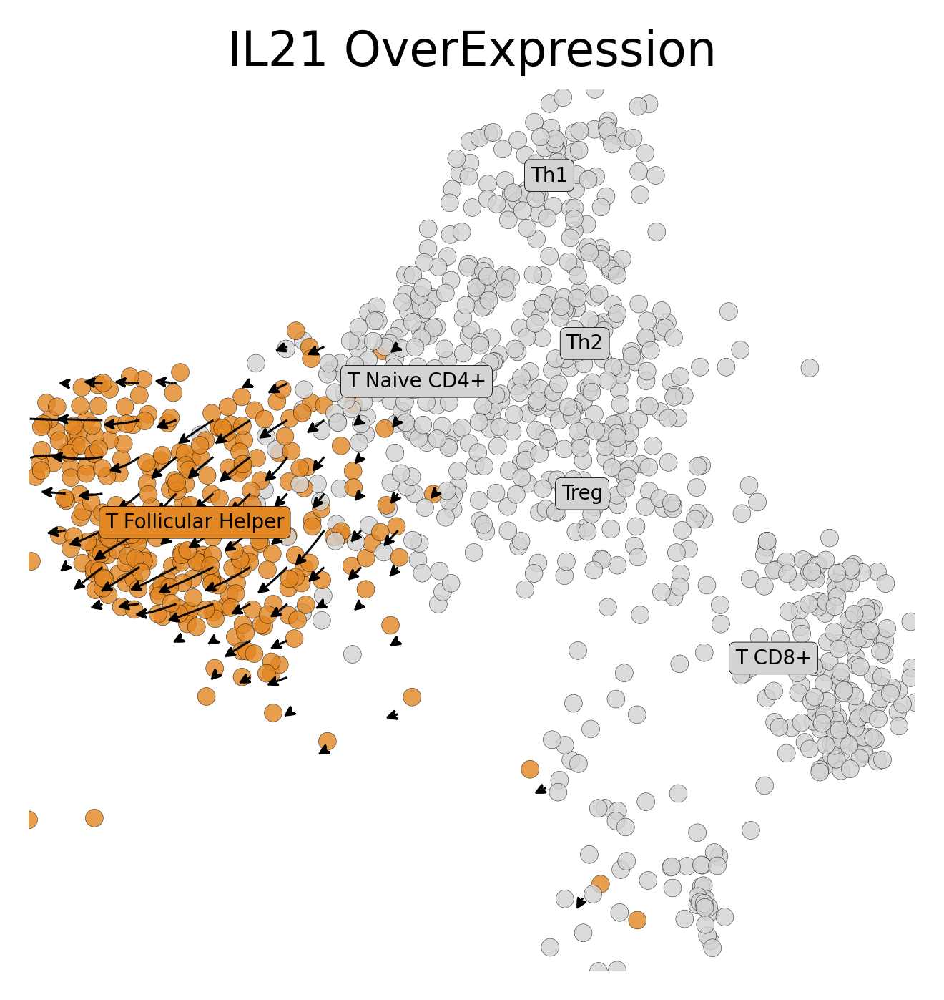

In [201]:
perturbed_df = pd.read_parquet(
    '/Volumes/SSD/genome_screens/human_tonsil/IL21_4n_maxx.parquet')

grid_points, vector_field = tonsil.plot_arrows(
    perturb_target='', 
    perturbed_df=perturbed_df,
    mode='0',
    hue='cell_type_2',
    curve=True,
    vector_scale=0.4, 
    grid_scale=1,
    n_neighbors=200,
    scale=2, 
    grains=25,
    figsize=(4, 4),
    dpi=200,
    scatter_size=20,
    legend_fontsize=5,
    rename={
        'T_follicular_helper': 'T Follicular Helper',
        'T_CD8': 'T CD8+',
        'Naive CD4 T': 'T Naive CD4+',
    },
    limit_clusters=True,
    highlight_clusters=[
        'T_follicular_helper', 
    ]
)

plt.title('IL21 OverExpression')

plt.savefig(
    './figures/IL21_OVX.svg', 
    **figure_params
)

plt.show()

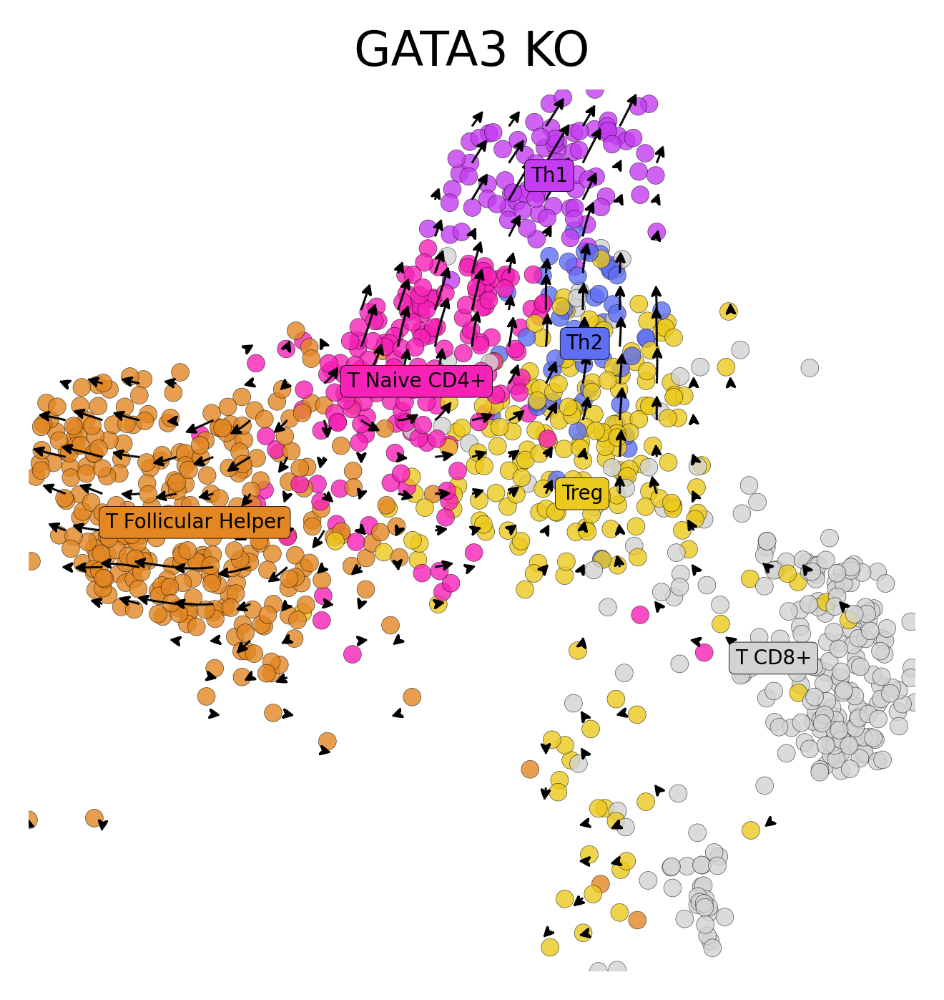

In [208]:
perturbed_df = pd.read_parquet(
    '/Volumes/SSD/genome_screens/human_tonsil/GATA3_4n_0x.parquet')


grid_points, vector_field = tonsil.plot_arrows(
    perturb_target='', 
    perturbed_df=perturbed_df,
    mode='0',
    hue='cell_type_2',
    curve=True,
    vector_scale=0.4, 
    grid_scale=1,
    n_neighbors=200,
    scale=2, 
    grains=25,
    figsize=(4, 4),
    dpi=200,
    scatter_size=20,
    legend_fontsize=5,
    rename={
        'T_follicular_helper': 'T Follicular Helper',
        'T_CD8': 'T CD8+',
        'Naive CD4 T': 'T Naive CD4+',
    },
    limit_clusters=True,
    highlight_clusters=[
        'T_follicular_helper', 
        'Th1',
        'Th2',
        'Naive CD4 T',
        'Treg'
    ]
)

plt.title('GATA3 KO')

plt.savefig(
    './figures/GATA3_KO.svg', 
    dpi=300, 
    bbox_inches='tight', 
    format='svg', 
    transparent=True
)

plt.show()

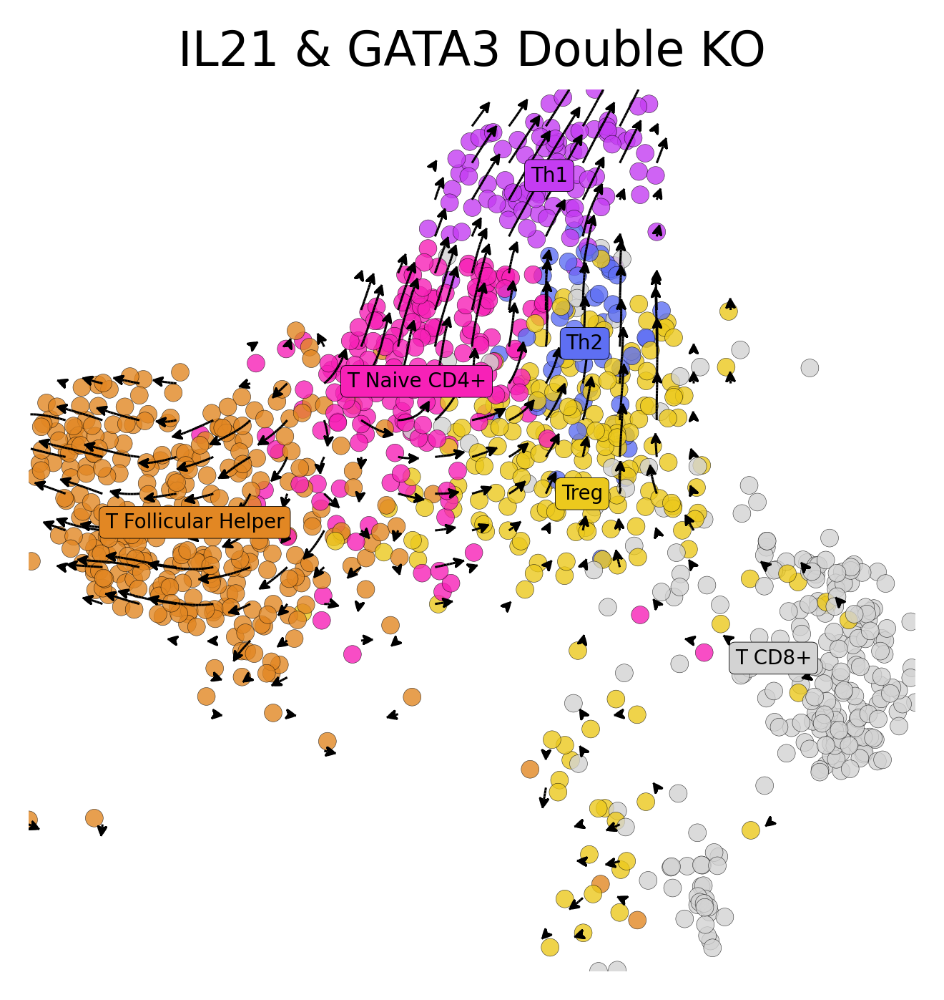

In [211]:
perturbed_df = pd.read_parquet(
    '/Volumes/SSD/genome_screens/tonsil_special/GATA3_4n_0x_IL21_4n_0x.parquet')

grid_points, vector_field = tonsil.plot_arrows(
    perturb_target='', 
    perturbed_df=perturbed_df,
    mode='0',
    hue='cell_type_2',
    curve=True,
    vector_scale=0.4, 
    grid_scale=1,
    n_neighbors=200,
    scale=3.5, 
    grains=25,
    figsize=(4, 4),
    dpi=200,
    scatter_size=20,
    legend_fontsize=5,
    rename={
        'T_follicular_helper': 'T Follicular Helper',
        'T_CD8': 'T CD8+',
        'Naive CD4 T': 'T Naive CD4+',
    },
    limit_clusters=True,
    highlight_clusters=[
        'T_follicular_helper', 
        'Th1',
        'Th2',
        'Naive CD4 T',
        'Treg'
    ]
)

plt.title('IL21 & GATA3 Double KO')

plt.savefig(
    './figures/IL21_GATA3_KO.svg', 
    **figure_params
)

plt.show()

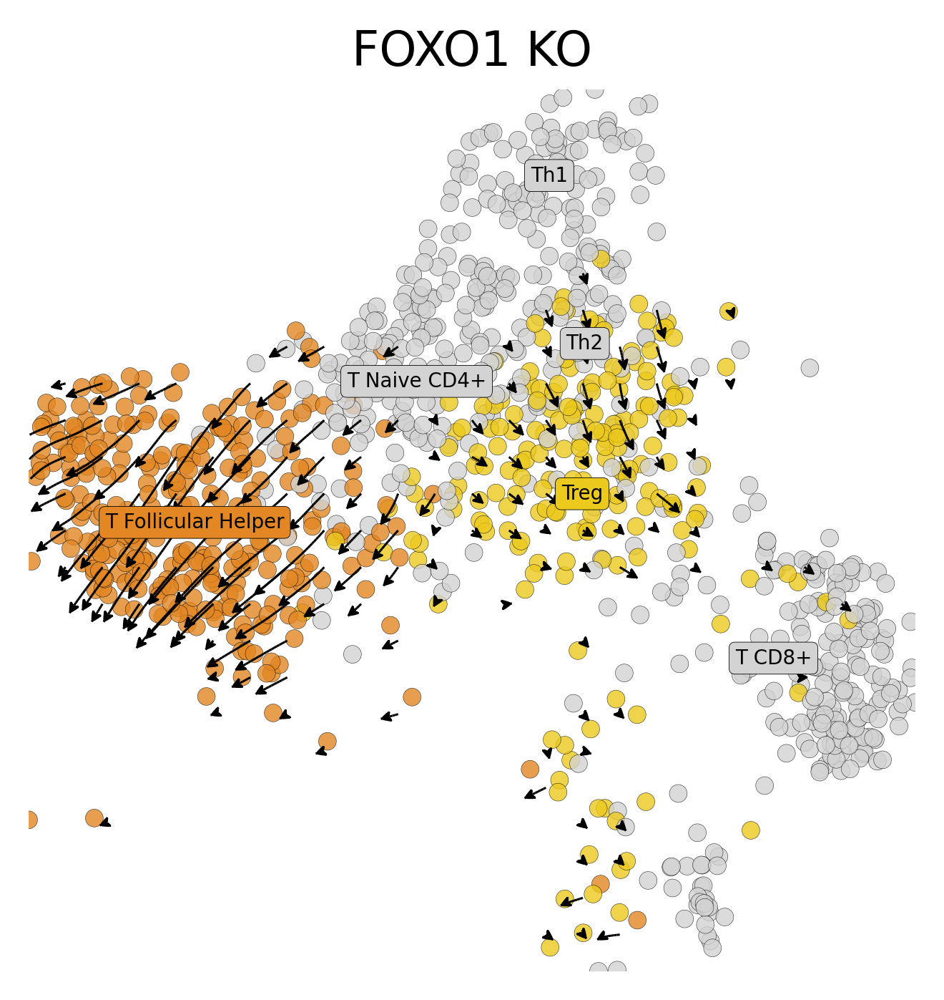

In [224]:

perturbed_df = pd.read_parquet(
    '/Volumes/SSD/genome_screens/human_tonsil/FOXO1_4n_0x.parquet')

grid_points, vector_field = tonsil.plot_arrows(
    perturb_target='', 
    perturbed_df=perturbed_df,
    mode='0',
    hue='cell_type_2',
    curve=True,
    vector_scale=0.4, 
    grid_scale=1,
    n_neighbors=270,
    scale=4, 
    grains=25,
    figsize=(4, 4),
    dpi=200,
    scatter_size=20,
    legend_fontsize=5,
    rename={
        'T_follicular_helper': 'T Follicular Helper',
        'T_CD8': 'T CD8+',
        'Naive CD4 T': 'T Naive CD4+',
    },
    limit_clusters=True,
    highlight_clusters=[
        'T_follicular_helper', 
        # 'Naive CD4 T',
        'Treg',
    ]
)

plt.title('FOXO1 KO')

plt.savefig(
    './figures/FOXO1_KO.svg', 
    **figure_params
)

plt.show()

In [ ]:
# grid_points, vector_field = tonsil.plot_arrows_pseudotime(
#     perturb_target='IL21', 
#     perturbed_df=pd.read_parquet(
#         '/Volumes/SSD/genome_screens/tonsil_special/IL21_OVX_T_follicular_helper.parquet'),
#     # mode='max',
#     mode='0',
#     hue='cell_type_2',
#     curve=True,
#     vector_scale=0.02, 
#     grid_scale=1,
#     n_neighbors=160,
#     scale=3, 
#     grains=25,
#     figsize=(4, 4),
#     dpi=200,
#     scatter_size=20,
#     legend_fontsize=5,
#     rename={
#         'T_follicular_helper': 'T Follicular Helper',
#         'T_CD8': 'T CD8+',
#         'Naive CD4 T': 'T Naive CD4+',
#     },
#     iroot='Naive CD4 T',
#     limit_clusters=True,
#     highlight_clusters=[
#         # 'Naive CD4 T',
#         'T_follicular_helper', 
#         # 'Th2', 
#         # 'Th1', 
#         # 'Treg',
#         # 'T_CD8',
#         # 'GC Light Zone',
#         # 'GC Dark Zone',
#         # 'GC Intermediate Zone',
#         # 'B_memory',
#         # 'B_naive',
#         # 'plasma'
#     ]
# )

# plt.savefig(
#     './figures/IL21_OVX_Tfh_pseudotime.svg', 
#     **figure_params
# )

# plt.show()


# grid_points, vector_field = tonsil.plot_arrows(
#     perturb_target='IL21', 
#     perturbed_df=pd.read_parquet(
#         '/Volumes/SSD/genome_screens/tonsil_special/IL21_OVX_T_follicular_helper.parquet'),
#     # mode='max',
#     mode='0',
#     hue='cell_type_2',
#     curve=True,
#     vector_scale=0.02, 
#     grid_scale=1,
#     n_neighbors=160,
#     scale=3, 
#     grains=25,
#     figsize=(4, 4),
#     dpi=200,
#     scatter_size=20,
#     legend_fontsize=5,
#     rename={
#         'T_follicular_helper': 'T Follicular Helper',
#         'T_CD8': 'T CD8+',
#         'Naive CD4 T': 'T Naive CD4+',
#     },
#     limit_clusters=True,
#     highlight_clusters=[
#         # 'Naive CD4 T',
#         'T_follicular_helper', 
#         # 'Th2', 
#         # 'Th1', 
#         # 'Treg',
#         # 'T_CD8',
#         # 'GC Light Zone',
#         # 'GC Dark Zone',
#         # 'GC Intermediate Zone',
#         # 'B_memory',
#         # 'B_naive',
#         # 'plasma'
#     ]
# )

# plt.savefig(
#     './figures/IL21_OVX_Tfh.svg', 
#     **figure_params
# )

# plt.show()

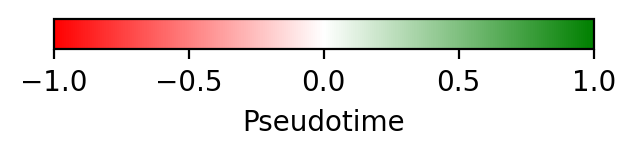

In [23]:
fig = plt.figure(figsize=(3, 1), dpi=100)
ax1 = fig.add_axes([0.05, 0.80, 0.9, 0.15])
cmap = LinearSegmentedColormap.from_list('custom', ['red', 'white', 'green'])
norm = mpl.colors.Normalize(vmin=-1, vmax=1)
cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=cmap,
                                norm=norm,
                                orientation='horizontal')
cb1.set_label('Pseudotime')
plt.savefig('./figures/pseudotime_colorbar.svg', dpi=300, bbox_inches='tight', format='svg', transparent=True)
plt.show()

In [24]:
atmp = adata[~adata.obs.index.isin(adata.obs.iloc[[2250, 2593, 3255, 5281]].index)]

In [25]:
atmp = atmp[atmp.obs.cell_type_2.isin([
        'Naive CD4 T',
        'T_follicular_helper', 
        'Th2', 
        'Th1', 
        'Treg',
        # 'T_CD8',
    ])]

In [46]:
adata = sc.read_h5ad('/Users/koush/Desktop/training_data/snrna_human_tonsil.h5ad')
adata.obsm['X_umap'] = pd.read_csv('../../notebooks/human_tonsil/umap.csv', index_col=0).values
adata.obs = adata.obs.join(pd.read_csv('../../notebooks/human_tonsil/tonsil_cell_types.csv', index_col=0))
sc.pp.pca(adata)
sc.pp.neighbors(adata)
adata.layers['imputed_count'] = np.load('../../notebooks/human_tonsil/imputed_counts.npy')

In [55]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['cell_type_2'] == 'T_follicular_helper')[0]
sc.tl.diffmap(adata)
sc.tl.dpt(adata, n_dcs=10, n_branchings=0)

... storing 'cell_type_2' as categorical


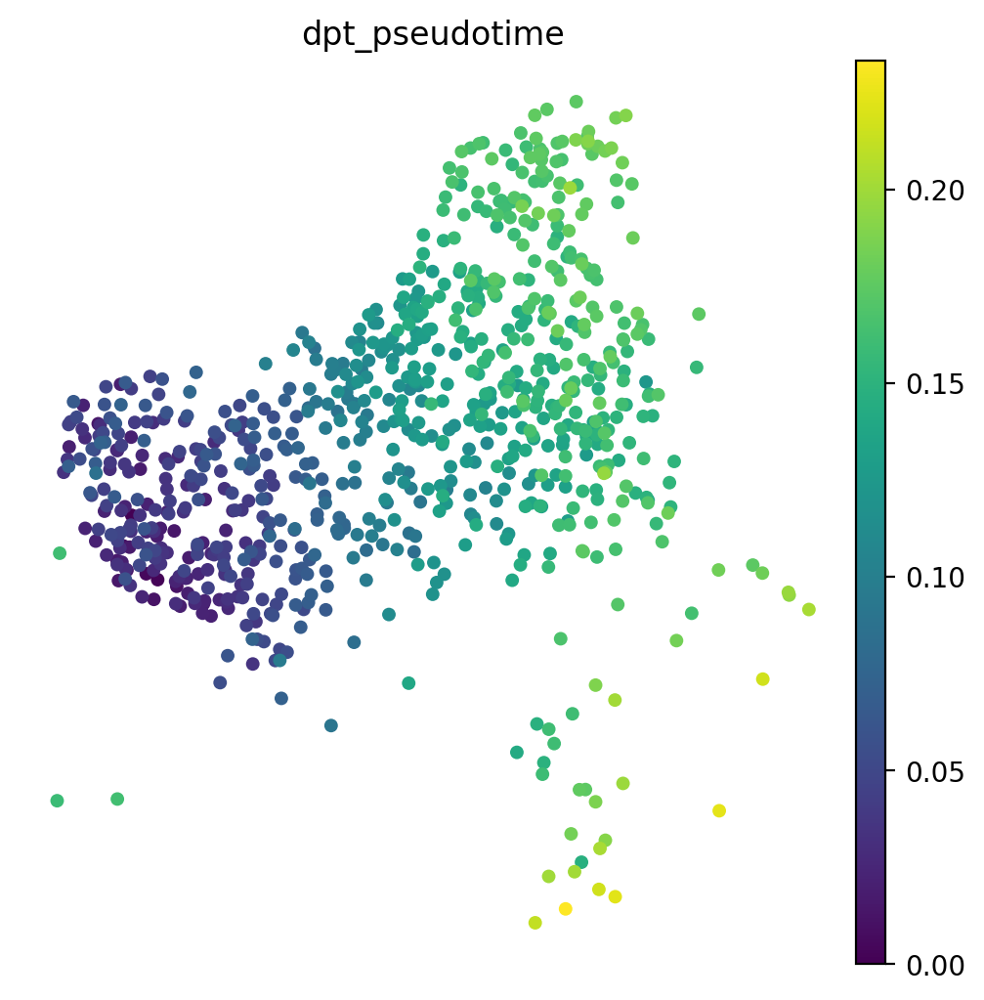

In [56]:
sc.pl.umap(adata[atmp.obs_names], color=['dpt_pseudotime'], size=100, frameon=False)

In [321]:
from celloracle.applications.differentiation_flow import get_gradient, normalize_gradient
import random
from spaceoracle.virtual_tissue import VirtualTissue

from sklearn.neighbors import KNeighborsRegressor

def _knn_regression(x, y, x_new, y_new, value, n_knn=30):

    data = np.stack([x, y], axis=1)

    model = KNeighborsRegressor(n_neighbors=n_knn)
    model.fit(data, value)

    data_new = np.stack([x_new, y_new], axis=1)

    return model.predict(data_new)

In [349]:
embedding = adata.obsm['X_umap']
x, y = embedding[:, 0], embedding[:, 1]
x_new, y_new = grid_points[:, 0], grid_points[:, 1]

value = adata.obs.dpt_pseudotime.values
# value = tonsil.load_betadata(gene='IL21')['beta_FOXP3'].values

pseudotime_on_grid = _knn_regression(x, y, x_new, y_new, value, n_knn=30)
gradient = get_gradient(value_on_grid=pseudotime_on_grid)
gradient = normalize_gradient(gradient, method="sqrt")
l2_norm = np.linalg.norm(gradient, ord=2, axis=1)
scale_factor = 1 / l2_norm.mean()
ref_flow = gradient * 2

zero_mask = (vector_field[:,0] == 0) & (vector_field[:,1] == 0)
ref_flow[zero_mask] = 0

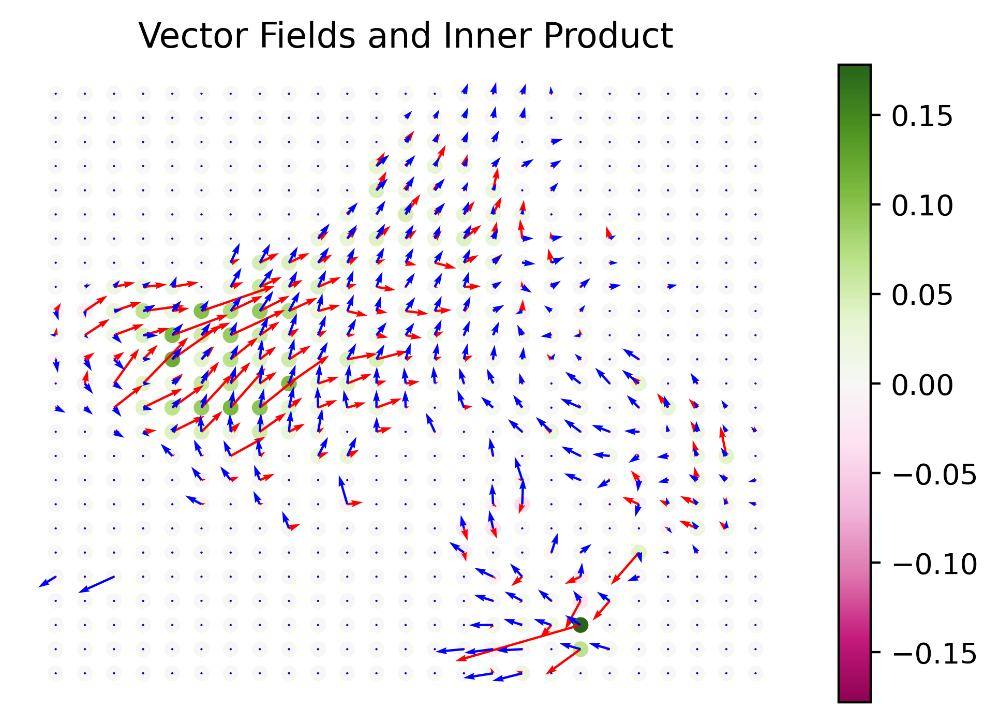

In [350]:
inner_product = np.sum(vector_field * ref_flow, axis=1)
fig, ax = plt.subplots(figsize=(6, 4), dpi=200)
vmax = np.abs(inner_product).max()
scatter = ax.scatter(grid_points[:,0], grid_points[:,1], 
                    c=inner_product, cmap='PiYG', s=20,
                    vmin=-vmax, vmax=vmax)

ax.quiver(grid_points[:,0], grid_points[:,1],
          vector_field[:,0], vector_field[:,1],
          angles='xy', scale_units='xy', scale=1,
          alpha=1, color='red', width=0.003)

ax.quiver(grid_points[:,0], grid_points[:,1],
          ref_flow[:, 0], ref_flow[:, 1], 
          angles='xy', scale_units='xy', scale=1,
          alpha=1, color='blue', width=0.003)

ax.set_xlabel('UMAP 1')
ax.set_ylabel('UMAP 2')
ax.set_title('Vector Fields and Inner Product')
ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
plt.colorbar(scatter)

plt.show()

# Compare CellOracle vs SpaceTravLR